In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
import os
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import os
import pandas as pd
import numpy as np
from scipy.stats import ttest_ind

In [42]:
def get_image_filenames(directory):
        return set(f for f in os.listdir(directory) if f.lower().endswith(('.png', '.jpg', '.jpeg')))

reference_dir = r"C:\Users\drieb\Downloads\ucla-protest\UCLA-protest\HongKongProtests2019_gallery_001 (1)"
reference_images = get_image_filenames(reference_dir)


output_csvpath = "result.csv"
df = pd.read_csv(output_csvpath)

if 'imgpath' in df.columns:
    df['filename'] = df['imgpath'].apply(os.path.basename)
    filtered_df = df[df['filename'].isin(reference_images)]


    print(filtered_df)  
    filtered_df.to_csv("filtered_results.csv", index=False) 
else:
    print("Error: 'imgpath' column not found in the DataFrame.")



                                              imgpath   protest  violence  \
0   C:\Users\drieb\Downloads\ucla-protest\UCLA-pro...  0.074524  0.425116   
1   C:\Users\drieb\Downloads\ucla-protest\UCLA-pro...  0.139021  0.465599   
2   C:\Users\drieb\Downloads\ucla-protest\UCLA-pro...  0.037473  0.304252   
3   C:\Users\drieb\Downloads\ucla-protest\UCLA-pro...  0.392919  0.497004   
4   C:\Users\drieb\Downloads\ucla-protest\UCLA-pro...  0.657411  0.622645   
..                                                ...       ...       ...   
61  C:\Users\drieb\Downloads\ucla-protest\UCLA-pro...  0.096156  0.387275   
62  C:\Users\drieb\Downloads\ucla-protest\UCLA-pro...  0.735976  0.488376   
63  C:\Users\drieb\Downloads\ucla-protest\UCLA-pro...  0.336259  0.401409   
64  C:\Users\drieb\Downloads\ucla-protest\UCLA-pro...  0.957274  0.487161   
65  C:\Users\drieb\Downloads\ucla-protest\UCLA-pro...  0.687271  0.426246   

        sign     photo      fire    police  children  group_20  group_100  

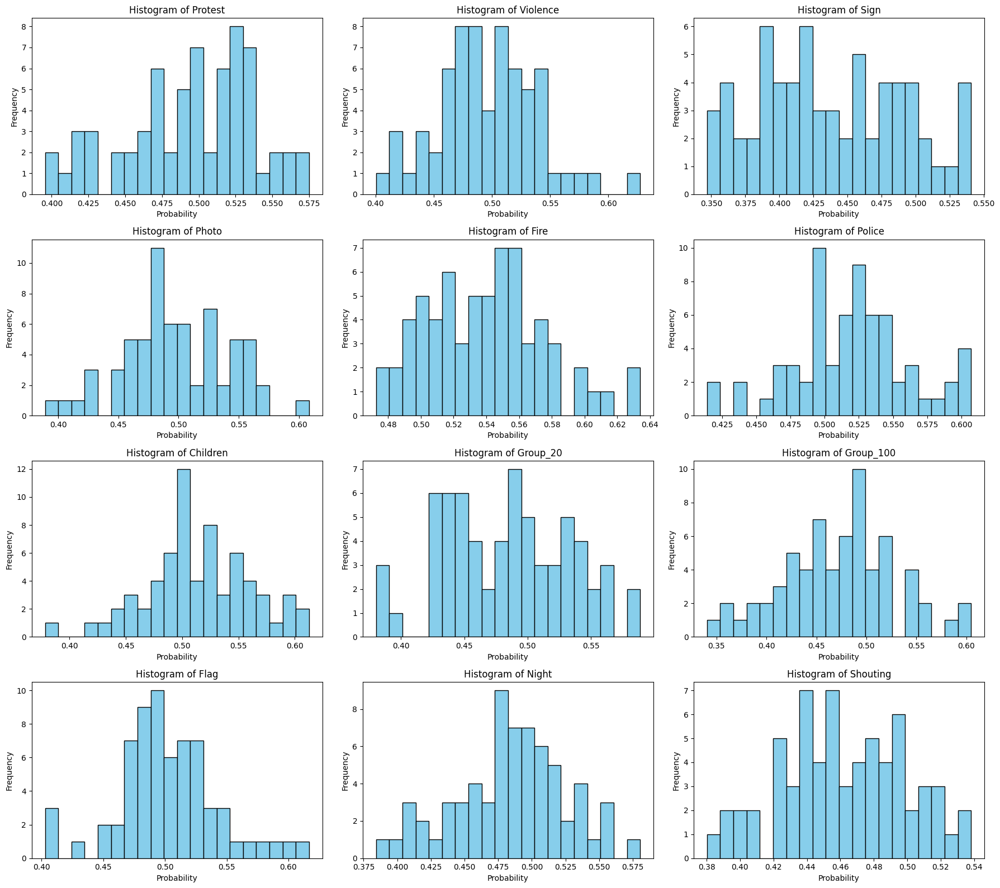

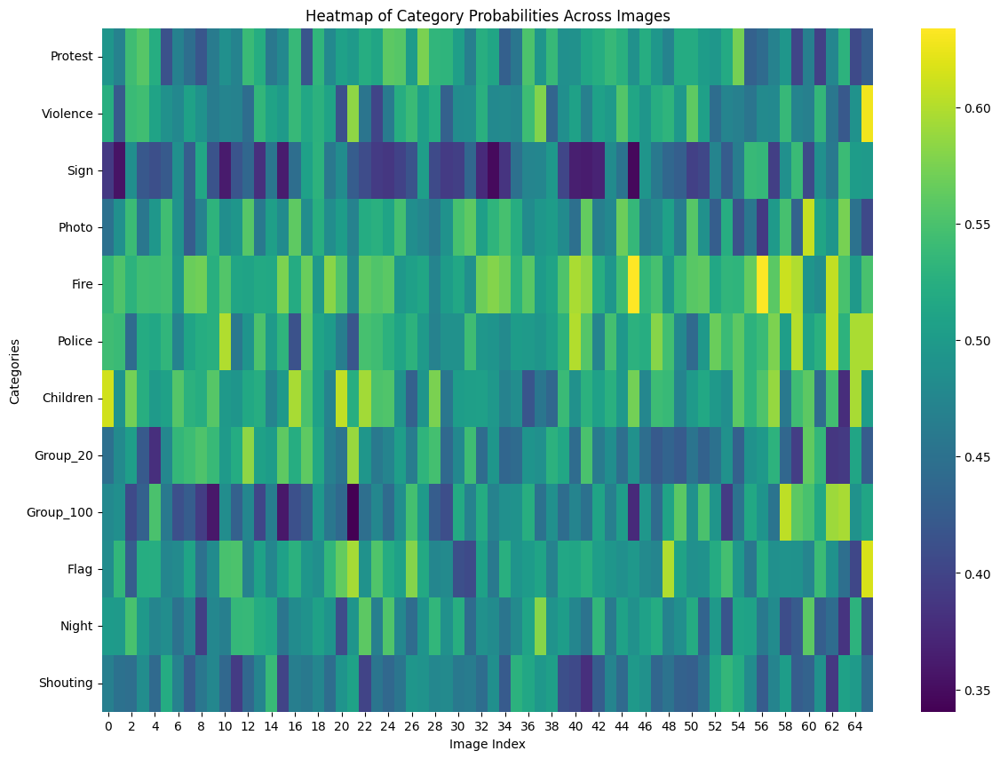

In [43]:
# Histograms and Heatmap
fig, axes = plt.subplots(4, 3, figsize=(18, 16))
categories = df_results.columns[1:] 

for ax, category in zip(axes.flat, categories):
    ax.hist(df_results[category], bins=20, color='skyblue', edgecolor='black')
    ax.set_title(f'Histogram of {category}')
    ax.set_xlabel('Probability')
    ax.set_ylabel('Frequency')

plt.tight_layout()
plt.show()

plt.figure(figsize=(14, 10))
sns.heatmap(df_results[categories].T, cmap='viridis', annot=False)
plt.title('Heatmap of Category Probabilities Across Images')
plt.xlabel('Image Index')
plt.ylabel('Categories')
plt.show()
 

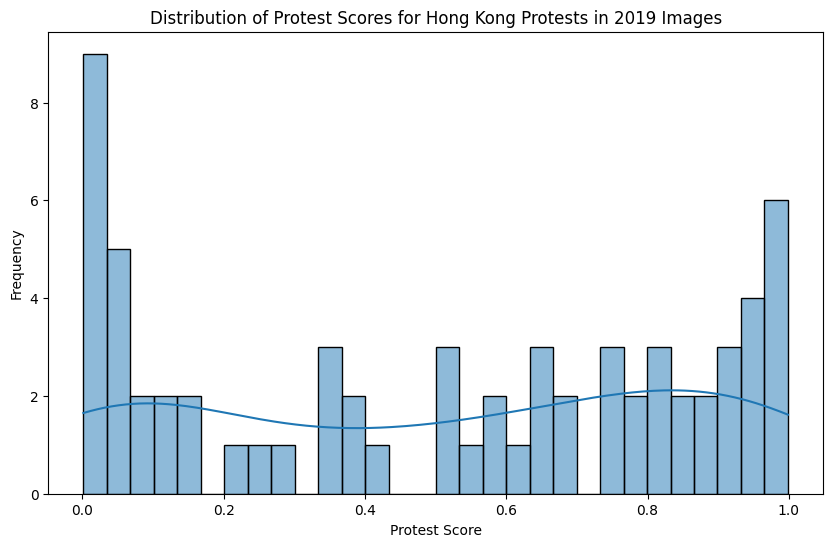

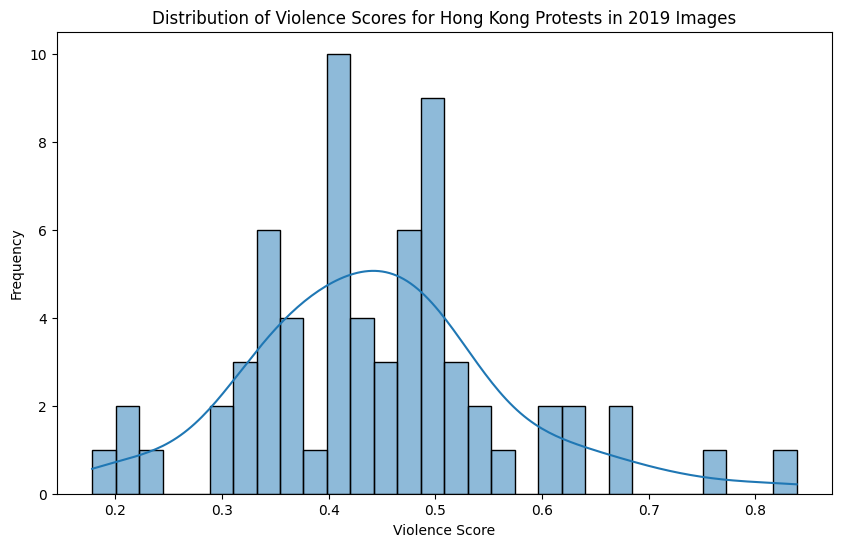

In [49]:
##Distribution Plots 
#Distribution of Protest Scores 
plt.figure(figsize=(10, 6))
sns.histplot(filtered_df['protest'], bins=30, kde=True)
plt.title('Distribution of Protest Scores for Hong Kong Protests in 2019 Images')
plt.xlabel('Protest Score')
plt.ylabel('Frequency')
plt.show()

#Distribution of Violence Scores 
plt.figure(figsize=(10, 6))
sns.histplot(filtered_df['violence'], bins=30, kde=True)
plt.title('Distribution of Violence Scores for Hong Kong Protests in 2019 Images')
plt.xlabel('Violence Score')
plt.ylabel('Frequency')
plt.show()

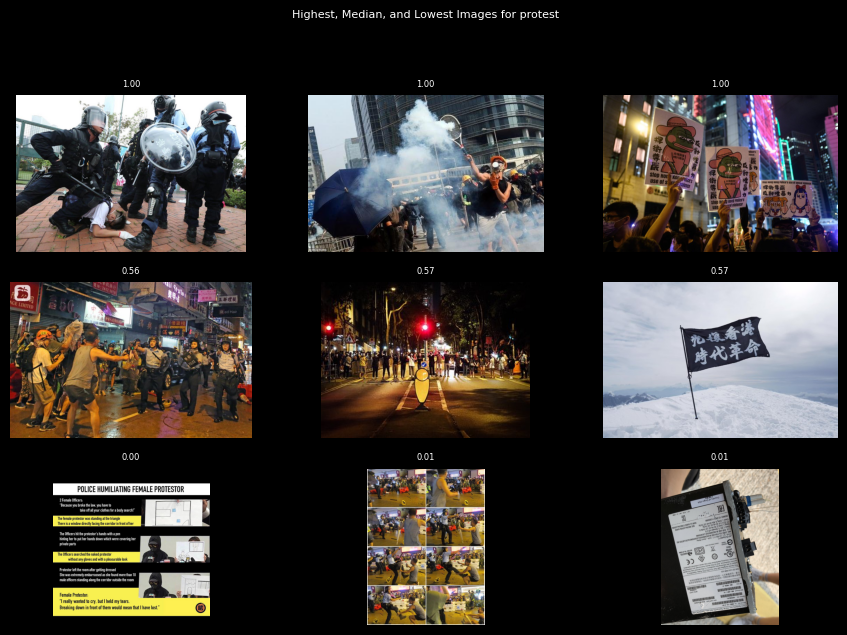

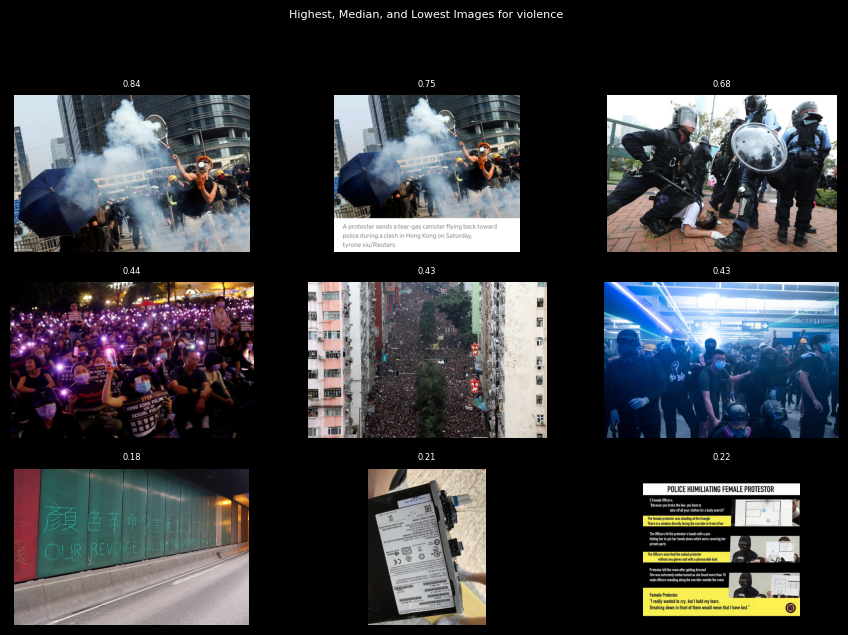

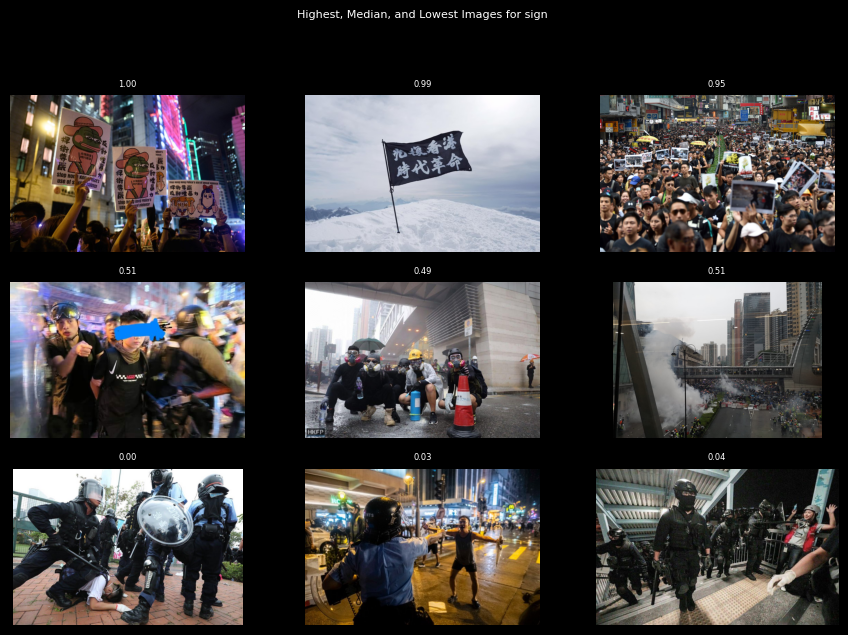

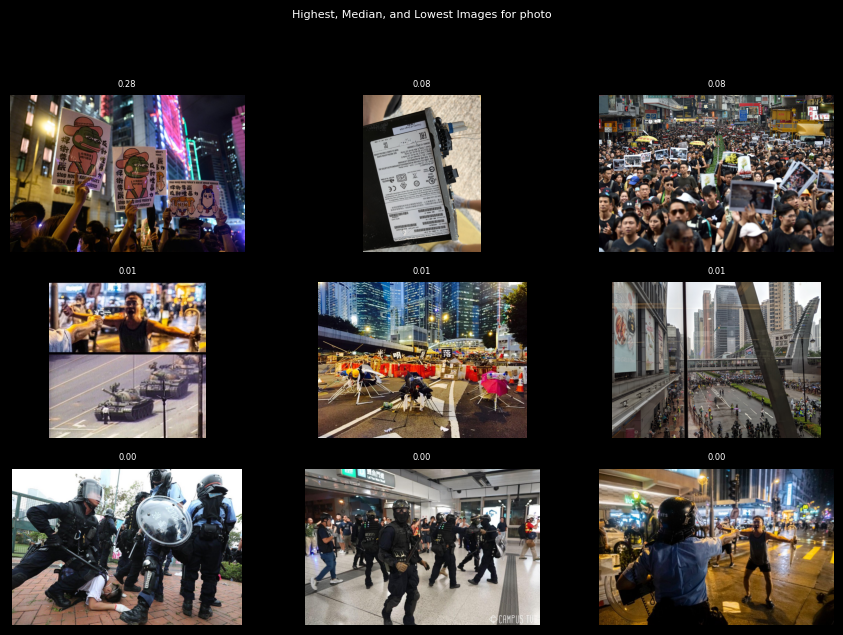

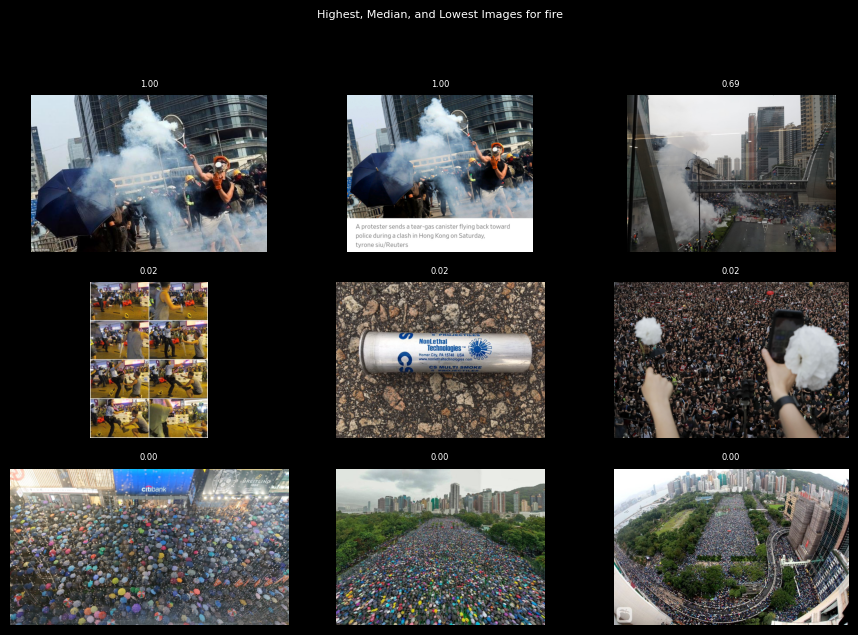

...

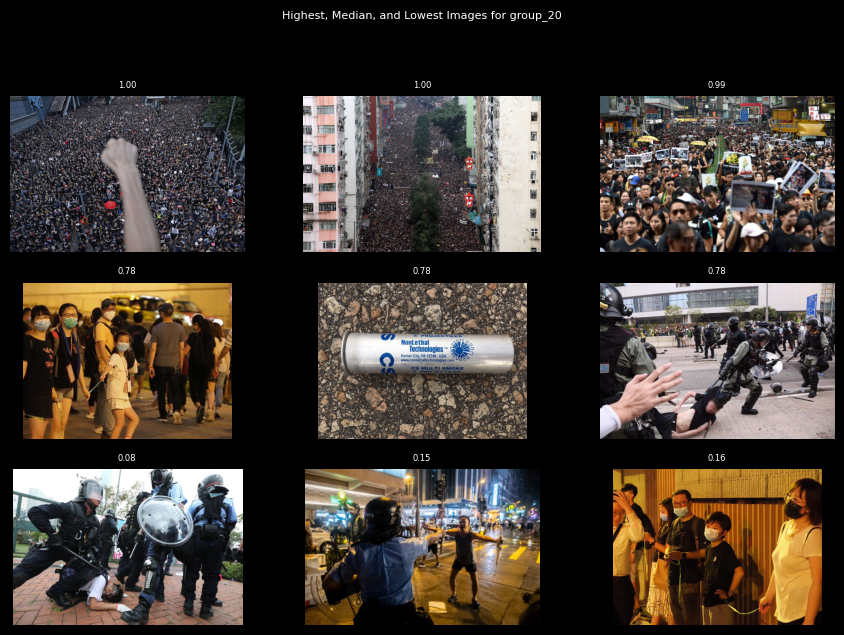

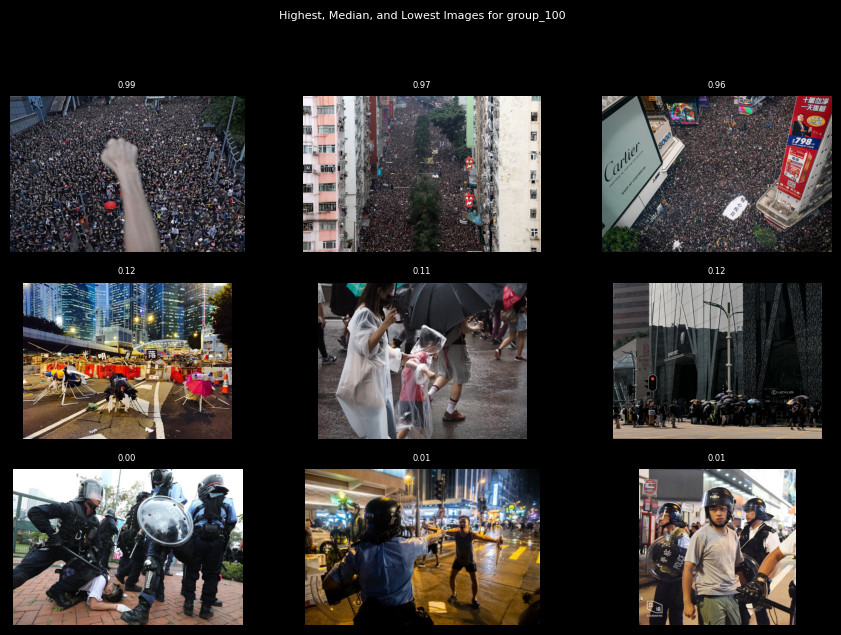

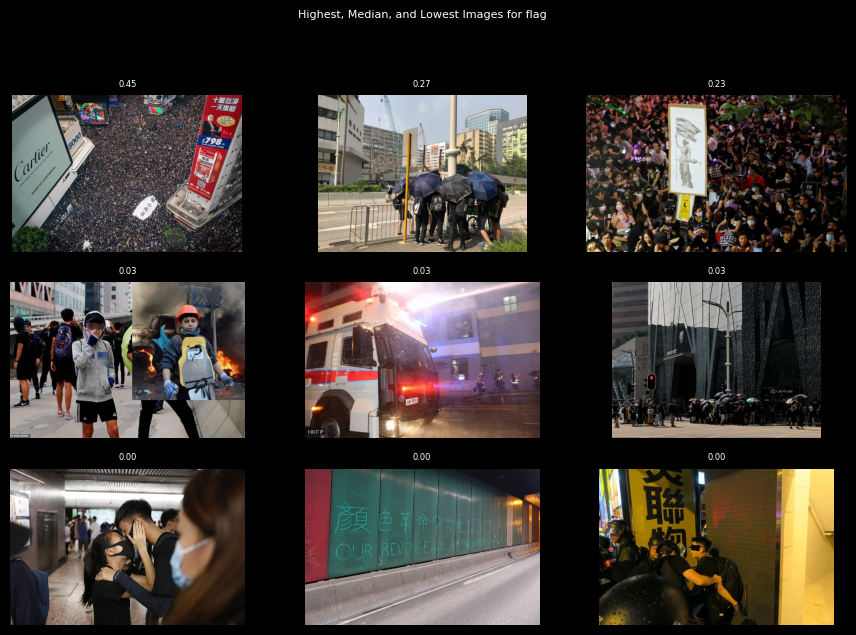

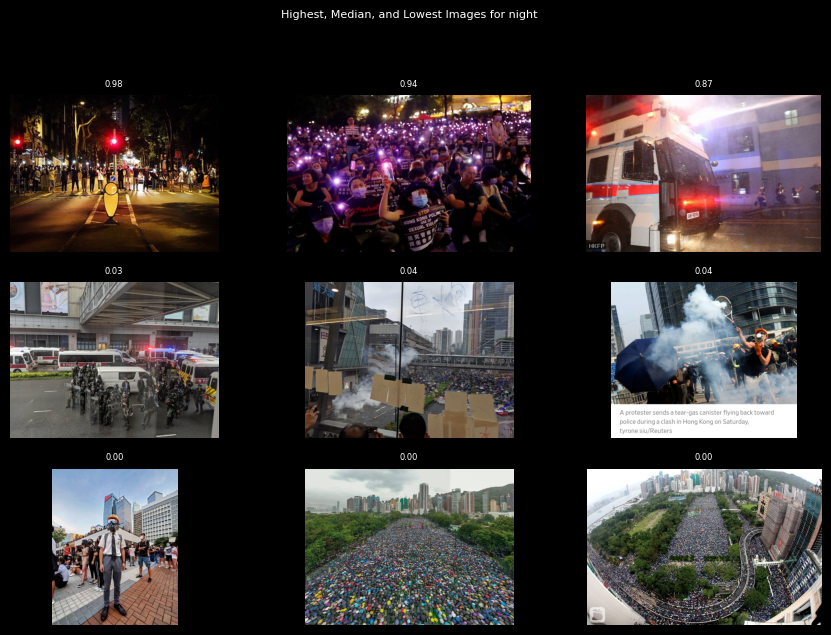

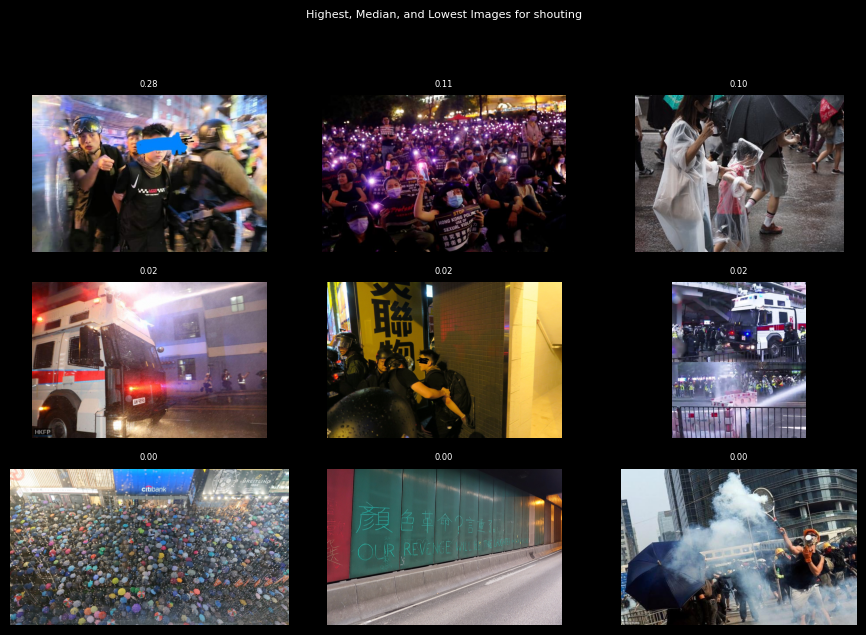

TypeError: Column 'filename' has dtype object, cannot use method 'nlargest' with this dtype

In [74]:
##Evaluation Plots 

results_csv_path = r"C:\Users\drieb\Downloads\ucla-protest\UCLA-protest\filtered_results.csv"
df_results = pd.read_csv(results_csv_path)

img_dir = r"C:\Users\drieb\Downloads\ucla-protest\UCLA-protest\HongKongProtests2019_gallery_001 (1)"

def display_images_with_scores(df, factor, img_dir):
    top_images = df.nlargest(3, factor)
    bottom_images = df.nsmallest(3, factor)

 
    median_val = df[factor].median()
    df['median_diff'] = np.abs(df[factor] - median_val)
    middle_images = df.nsmallest(3, 'median_diff')
    df.drop('median_diff', axis=1, inplace=True)  


    fig, axes = plt.subplots(3, 3, figsize=(9, 6), facecolor='black')  
    fig.suptitle(f'Highest, Median, and Lowest Images for {factor}', y=1.05, fontsize=8, color='white')


    for ax in axes.flatten():
        ax.set_facecolor('black')

    # Display top images
    for ax, (index, row) in zip(axes[0], top_images.iterrows()):
        img_path = os.path.join(img_dir, row['filename'])
        image = Image.open(img_path)
        ax.imshow(image)
        ax.set_title(f"{row[factor]:.2f}", fontsize=6, color='white')
        ax.axis('off')

    # Display middle images
    for ax, (index, row) in zip(axes[1], middle_images.iterrows()):
        img_path = os.path.join(img_dir, row['filename'])
        image = Image.open(img_path)
        ax.imshow(image)
        ax.set_title(f"{row[factor]:.2f}", fontsize=6, color='white')
        ax.axis('off')

    # Display bottom images
    for ax, (index, row) in zip(axes[2], bottom_images.iterrows()):
        img_path = os.path.join(img_dir, row['filename'])
        image = Image.open(img_path)
        ax.imshow(image)
        ax.set_title(f"{row[factor]:.2f}", fontsize=6, color='white')
        ax.axis('off')

    plt.tight_layout()
    plt.show()


for factor in df_results.columns[1:]: 
    display_images_with_scores(df_results, factor, img_dir)

 

Dataset loaded successfully.
Location column added.
Entries with 'Hong Kong': 66
Average Violence Level in Hong Kong: 0.445872603530303
Average Violence Level in Others: 0.30151791247974613
T-statistic: 8.973989841006288
P-value: 3.0085499295287764e-19
The difference in average violence levels between Hong Kong and Others is statistically significant.


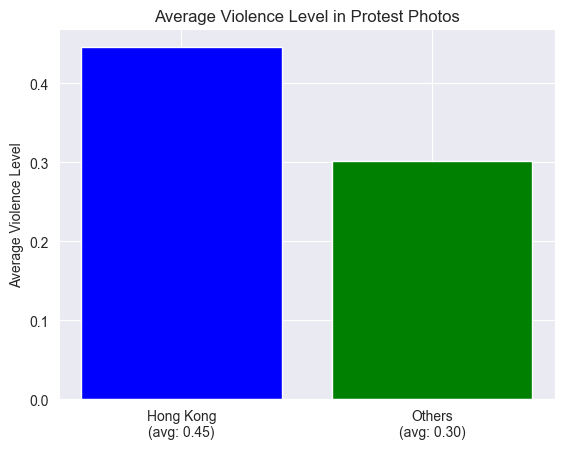

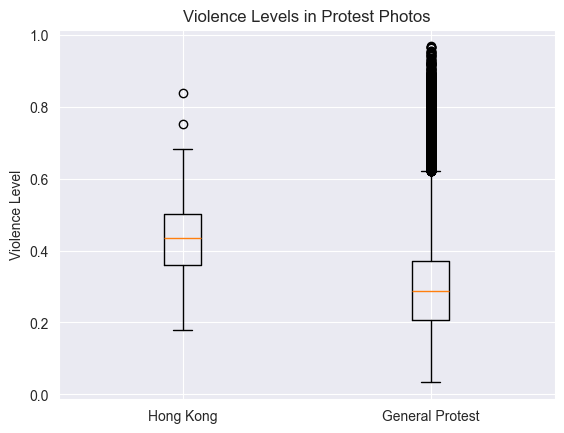

In [5]:
import pandas as pd
import matplotlib.pyplot as plt

csv_path = r'C:\Users\drieb\Downloads\ucla-protest\UCLA-protest\result - Copy (2).csv'

try:
    df = pd.read_csv(csv_path)
    print("Dataset loaded successfully.")
except FileNotFoundError:
    print("File not found. Check the file path.")


if 'imgpath' in df.columns:
    def infer_location(file_path):
        return 'Hong Kong' if 'HongKongProtests2019_gallery_001 (1)' in file_path else 'Others'

 
    df['location'] = df['imgpath'].apply(infer_location)
    print("Location column added.")


    print("Entries with 'Hong Kong':", df['location'].value_counts().get('Hong Kong', 0))


    hongkong_df = df[df['location'] == 'Hong Kong']
    non_hongkong_df = df[df['location'] != 'Hong Kong']

   
    avg_violence_hongkong = hongkong_df['violence'].mean()
    avg_violence_non_hongkong = non_hongkong_df['violence'].mean()
    
    print("Average Violence Level in Hong Kong:", avg_violence_hongkong)
    print("Average Violence Level in Others:", avg_violence_non_hongkong)

   
    t_stat, p_value = ttest_ind(hongkong_df['violence'], non_hongkong_df['violence'])

    print("T-statistic:", t_stat)
    print("P-value:", p_value)

    alpha = 0.05
    if p_value < alpha:
        print("The difference in average violence levels between Hong Kong and Others is statistically significant.")
    else:
        print("The difference in average violence levels between Hong Kong and Others is not statistically significant.")

    plt.bar(['Hong Kong\n(avg: {:.2f})'.format(avg_violence_hongkong), 'Others\n(avg: {:.2f})'.format(avg_violence_non_hongkong)], 
            [avg_violence_hongkong, avg_violence_non_hongkong], 
            color=['blue', 'green'])
    plt.title('Average Violence Level in Protest Photos')
    plt.ylabel('Average Violence Level')
    plt.show()

    plt.boxplot([hongkong_df['violence'], non_hongkong_df['violence']], labels=['Hong Kong', 'General Protest'])
    plt.title('Violence Levels in Protest Photos')
    plt.ylabel('Violence Level')
    plt.show()



Dataset loaded successfully.
Entries with a protest score higher than 0.4: 10239
Location column added.
Entries with 'Hong Kong': 38
Average Violence Level in Hong Kong: 0.4917133078684211
Average Violence Level in Others: 0.3712351427072836
T-statistic: 4.901953334008041
P-value: 9.634486174565366e-07
The difference in average violence levels between Hong Kong and Others is statistically significant.


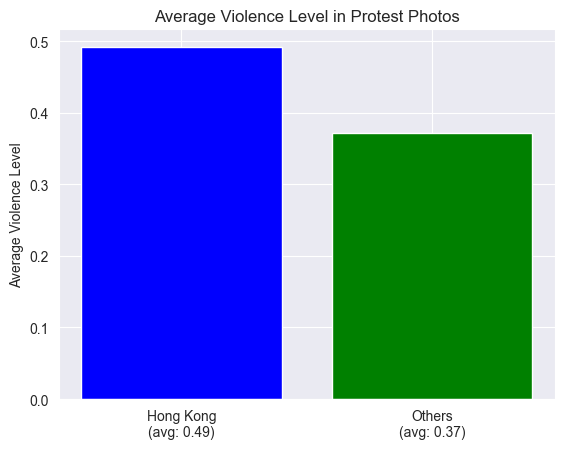

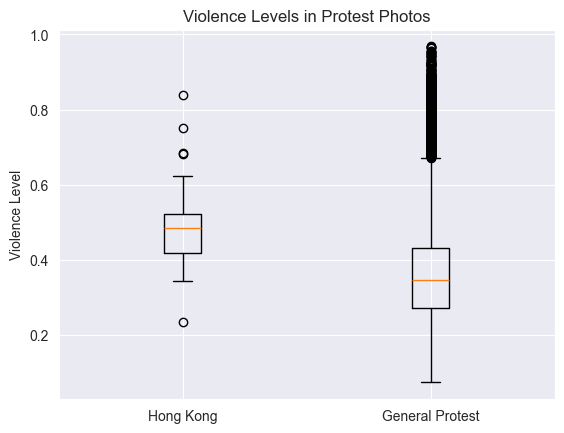

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind

csv_path = r'C:\Users\drieb\Downloads\ucla-protest\UCLA-protest\result - Copy (2).csv'

try:
    df = pd.read_csv(csv_path)
    print("Dataset loaded successfully.")
except FileNotFoundError:
    print("File not found. Check the file path.")

if 'protest' in df.columns:
    df = df[df['protest'] > 0.4]
    print(f"Entries with a protest score higher than 0.4: {len(df)}")

    if 'imgpath' in df.columns:
        def infer_location(file_path):
            return 'Hong Kong' if 'HongKongProtests2019_gallery_001 (1)' in file_path else 'Others'

        df['location'] = df['imgpath'].apply(infer_location)
        print("Location column added.")

        print("Entries with 'Hong Kong':", df['location'].value_counts().get('Hong Kong', 0))

        hongkong_df = df[df['location'] == 'Hong Kong']
        non_hongkong_df = df[df['location'] != 'Hong Kong']

        avg_violence_hongkong = hongkong_df['violence'].mean()
        avg_violence_non_hongkong = non_hongkong_df['violence'].mean()
        
        print("Average Violence Level in Hong Kong:", avg_violence_hongkong)
        print("Average Violence Level in Others:", avg_violence_non_hongkong)

        t_stat, p_value = ttest_ind(hongkong_df['violence'], non_hongkong_df['violence'])

        print("T-statistic:", t_stat)
        print("P-value:", p_value)

        alpha = 0.05
        if p_value < alpha:
            print("The difference in average violence levels between Hong Kong and Others is statistically significant.")
        else:
            print("The difference in average violence levels between Hong Kong and Others is not statistically significant.")

        plt.bar(['Hong Kong\n(avg: {:.2f})'.format(avg_violence_hongkong), 'Others\n(avg: {:.2f})'.format(avg_violence_non_hongkong)], 
                [avg_violence_hongkong, avg_violence_non_hongkong], 
                color=['blue', 'green'])
        plt.title('Average Violence Level in Protest Photos')
        plt.ylabel('Average Violence Level')
        plt.show()

        plt.boxplot([hongkong_df['violence'], non_hongkong_df['violence']], labels=['Hong Kong', 'General Protest'])
        plt.title('Violence Levels in Protest Photos')
        plt.ylabel('Violence Level')
        plt.show()
else:
    print("Column 'protest_score' not found in the dataset.")
